In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Uncompress the dataset
!unzip -uq "/content/drive/MyDrive/archive.zip" -d "sample_data/"

In [ ]:
!pip install kaggle

In [ ]:
# Adapted from: https://www.kaggle.com/code/rahulselvakumar/accident-detection/notebook
# Original code used for video preprocessing and initial anomaly detection logic.
# Credit to the author for the foundational implementation.

# Imports
import numpy as np
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers
from sklearn.metrics import confusion_matrix
import seaborn as sns

In [ ]:
# Set paths (Update this if you placed data in a different location in Drive)
data_dir = '/content/sample_data/data'

In [ ]:
# Parameters
batch_size = 100
img_height = 250
img_width = 250


In [ ]:
# Load datasets
training_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    os.path.join(data_dir, 'train'),
    seed=101,
    image_size=(img_height, img_width),
    batch_size=batch_size
)

Found 791 files belonging to 2 classes.


In [ ]:
testing_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    os.path.join(data_dir, 'test'),
    seed=101,
    image_size=(img_height, img_width),
    batch_size=batch_size
)

Found 100 files belonging to 2 classes.


In [ ]:
validation_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    os.path.join(data_dir, 'val'),
    seed=101,
    image_size=(img_height, img_width),
    batch_size=batch_size
)

Found 98 files belonging to 2 classes.


In [ ]:
class_names = training_dataset.class_names

In [ ]:
# Optimize datasets for performance
AUTOTUNE = tf.data.experimental.AUTOTUNE
training_dataset = training_dataset.cache().prefetch(buffer_size=AUTOTUNE)
testing_dataset = testing_dataset.cache().prefetch(buffer_size=AUTOTUNE)
validation_dataset = validation_dataset.cache().prefetch(buffer_size=AUTOTUNE)


In [ ]:
# Model definition
img_shape = (img_height, img_width, 3)
base_model = tf.keras.applications.MobileNetV2(input_shape=img_shape, include_top=False, weights='imagenet')
base_model.trainable = False

model = tf.keras.Sequential([
    base_model,
    layers.Conv2D(32, 3, activation='relu'),
    layers.Conv2D(64, 3, activation='relu'),
    layers.Conv2D(128, 3, activation='relu'),
    layers.Flatten(),
    layers.Dense(len(class_names), activation='softmax')
])

<ipython-input-19-87fb257bd697>:3: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = tf.keras.applications.MobileNetV2(input_shape=img_shape, include_top=False, weights='imagenet')


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:

# Train model
history = model.fit(training_dataset, validation_data=validation_dataset, epochs=50)


Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 42s 3s/step - accuracy: 0.5665 - loss: 0.8798 - val_accuracy: 0.4796 - val_loss: 0.6799
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 114ms/step - accuracy: 0.5715 - loss: 0.6689 - val_accuracy: 0.6429 - val_loss: 0.6100
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 114ms/step - accuracy: 0.6726 - loss: 0.5748 - val_accuracy: 0.7653 - val_loss: 0.5353
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.7604 - loss: 0.4635 - val_accuracy: 0.8265 - val_loss: 0.4465
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - accuracy: 0.8703 - loss: 0.3283 - val_accuracy: 0.8469 - val_loss: 0.3339
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - accuracy: 0.9277 - loss: 0.2004 - val_accuracy: 0.8367 - val_loss: 0.3361
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.9545 - loss: 0.1465 - val_accuracy: 0.9082 - val_loss: 0.2038
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - accuracy: 0.9802 - loss: 0.0757 - val_accuracy: 0.8776 - val_loss: 0

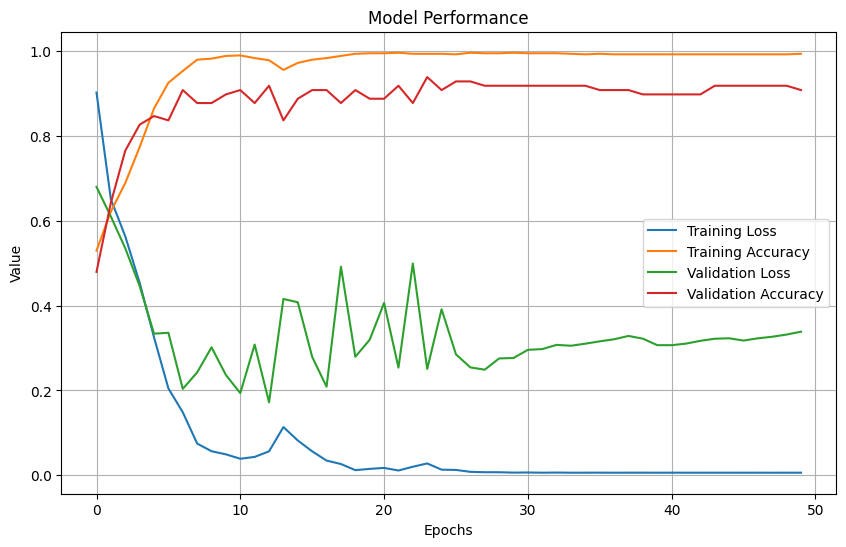

In [ ]:

# Plot accuracy and loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Performance')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.grid(True)
plt.show()

4/4 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step


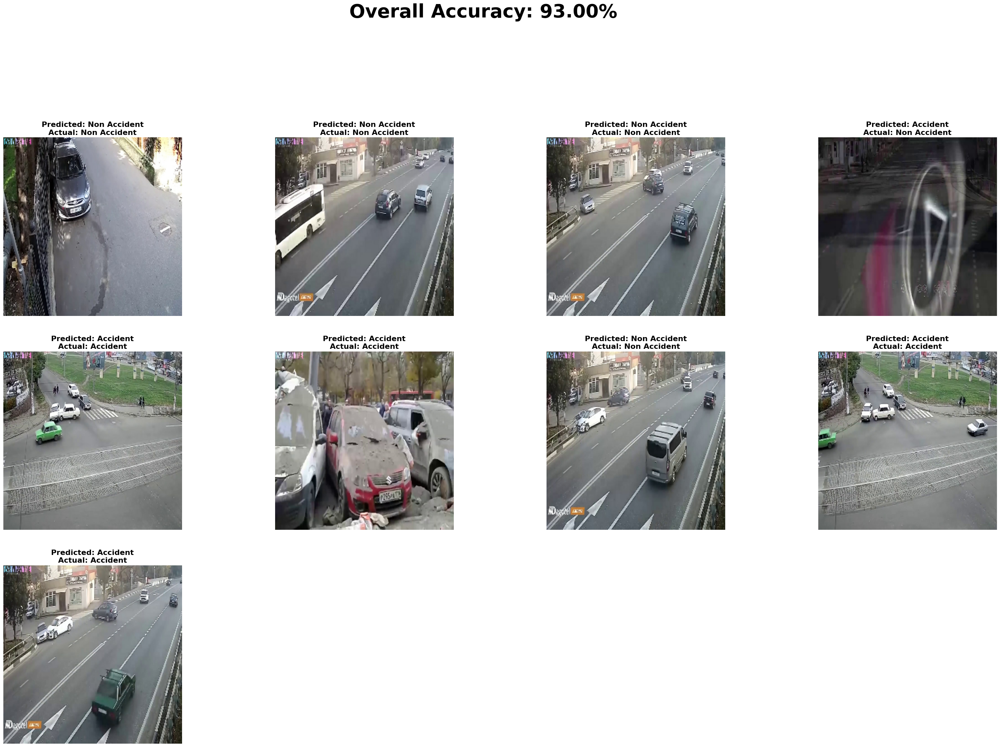

In [ ]:
# Evaluate on test set
AccuracyVector = []
plt.figure(figsize=(40, 40))

for images, labels in testing_dataset.take(1):
    predictions = model.predict(images)
    predlabel = []
    prdlbl = []

    for mem in predictions:
        predlabel.append(class_names[np.argmax(mem)])
        prdlbl.append(np.argmax(mem))

    AccuracyVector = np.array(prdlbl) == labels.numpy()
    accuracy = np.mean(AccuracyVector)

    for i in range(9):
        ax = plt.subplot(5, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(f'Predicted: {predlabel[i]}\nActual: {class_names[labels[i]]}', fontsize=16, fontweight='bold')
        plt.axis('off')

plt.suptitle(f'Overall Accuracy: {accuracy:.2%}', fontsize=40, fontweight='bold')
plt.show()

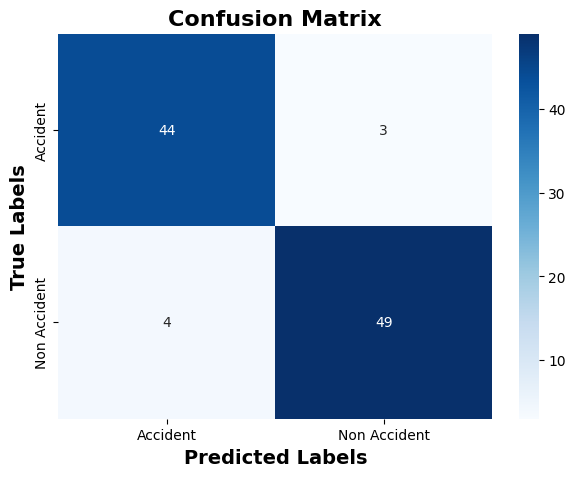

In [ ]:

# Confusion Matrix
conf_matrix = confusion_matrix(labels, prdlbl)
plt.figure(figsize=(7, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels', fontsize=14, fontweight='bold')
plt.ylabel('True Labels', fontsize=14, fontweight='bold')
plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
plt.show()



In [ ]:
print(class_names)


['Accident', 'Non Accident']



🚀 BONUS: Enhanced Accident Detection System Running...

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
✅ Sample 0: No accident detected.

✅ Sample 1: No accident detected.

✅ Sample 2: No accident detected.


🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128680 (\N{POLICE CARS REVOLVING LIGHT}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


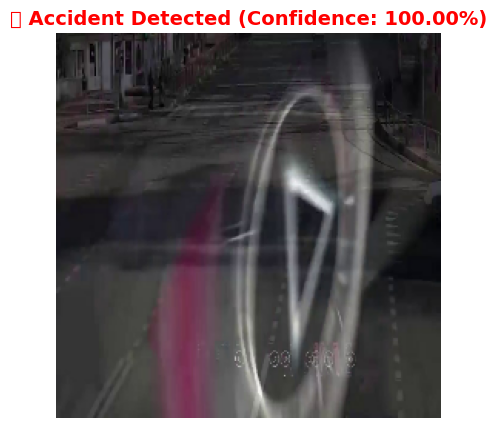

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 99.76% confidence! Immediate emergency alert triggered!


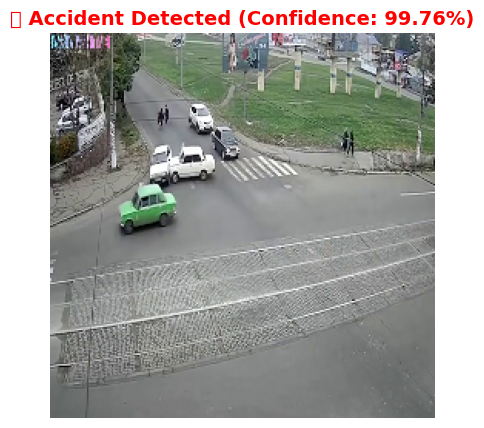

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 99.97% confidence! Immediate emergency alert triggered!


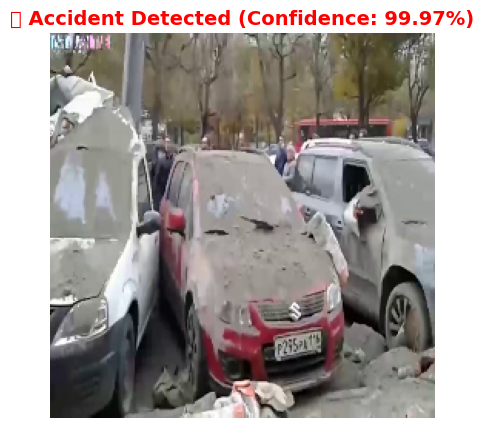

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...
✅ Sample 6: No accident detected.


🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


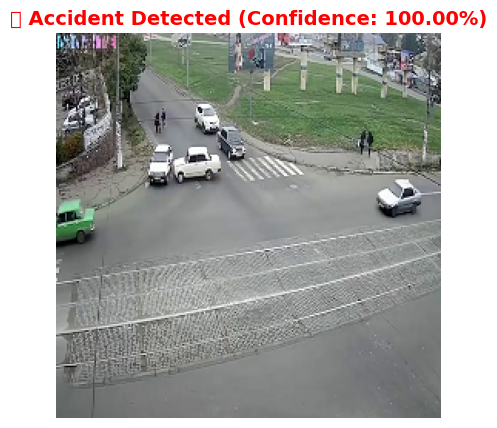

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


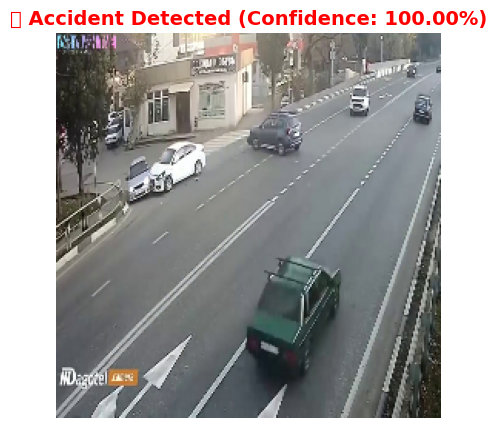

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...
✅ Sample 9: No accident detected.


🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


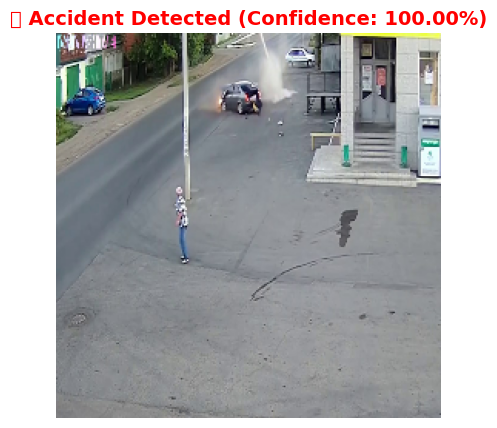

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


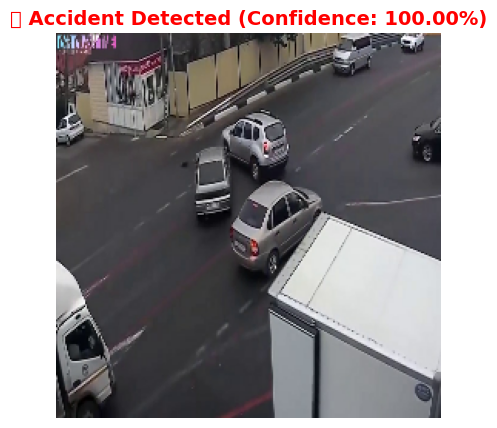

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...
✅ Sample 12: No accident detected.

✅ Sample 13: No accident detected.

✅ Sample 14: No accident detected.


🚨 CRITICAL Accident detected with 99.98% confidence! Immediate emergency alert triggered!


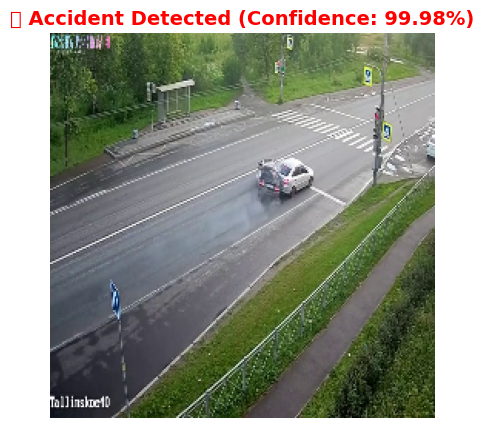

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 99.34% confidence! Immediate emergency alert triggered!


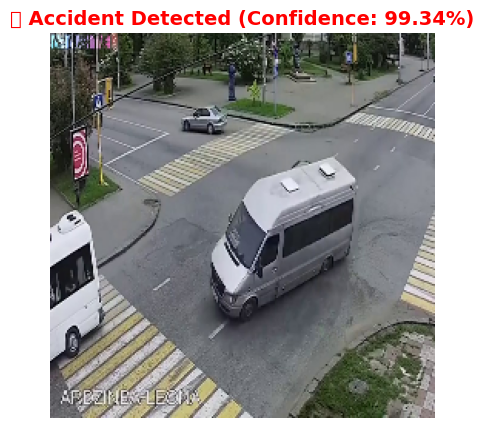

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...
✅ Sample 17: No accident detected.


🚨 CRITICAL Accident detected with 99.99% confidence! Immediate emergency alert triggered!


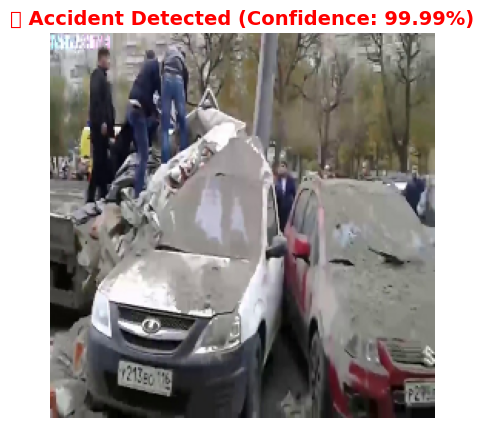

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 99.20% confidence! Immediate emergency alert triggered!


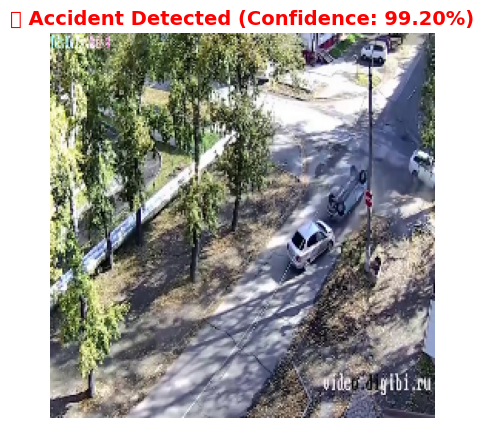

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


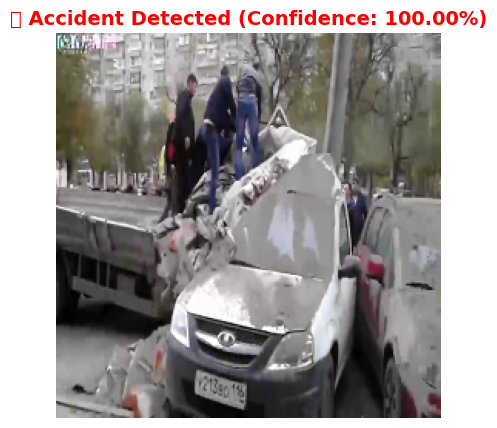

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


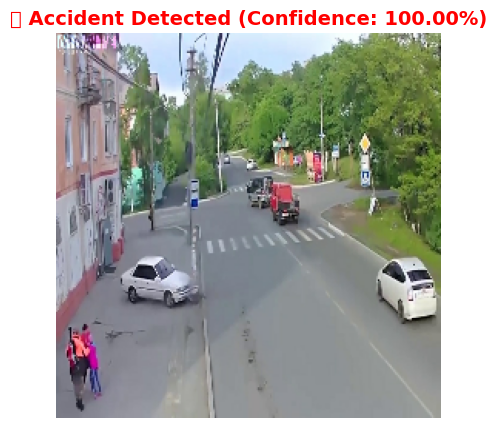

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


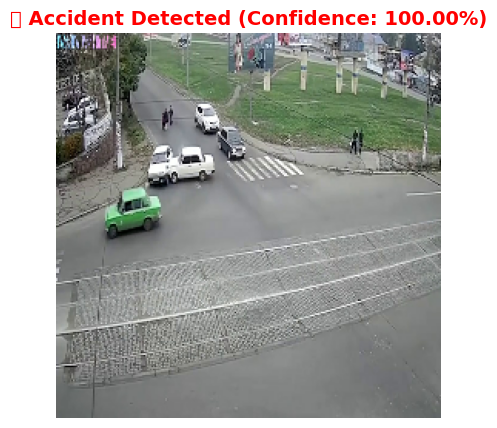

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...
✅ Sample 23: No accident detected.

✅ Sample 24: No accident detected.


🚨 CRITICAL Accident detected with 99.94% confidence! Immediate emergency alert triggered!


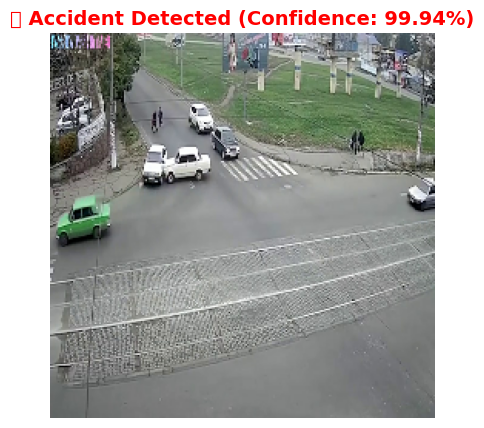

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


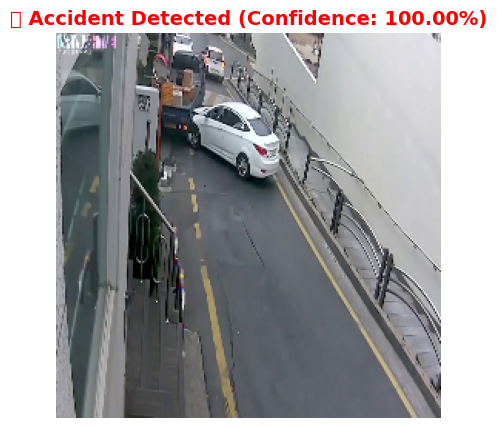

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


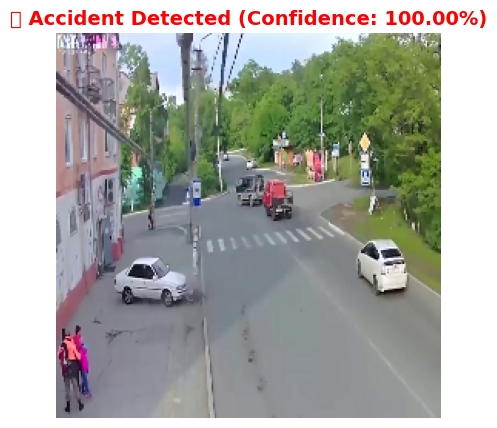

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 99.99% confidence! Immediate emergency alert triggered!


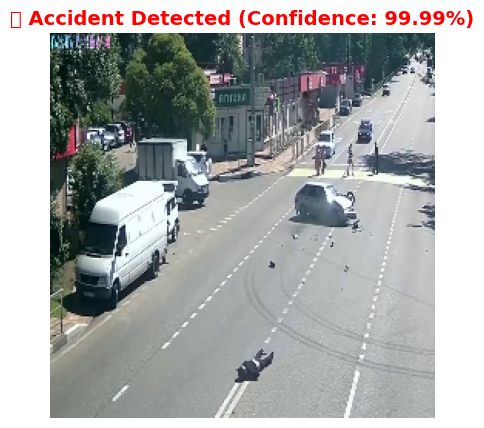

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...
✅ Sample 29: No accident detected.

✅ Sample 30: No accident detected.

✅ Sample 31: No accident detected.

✅ Sample 32: No accident detected.


🚨 CRITICAL Accident detected with 99.42% confidence! Immediate emergency alert triggered!


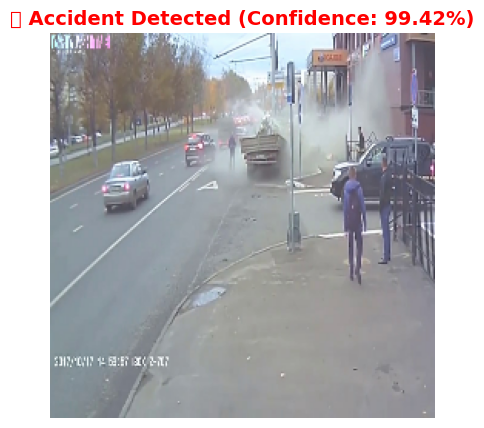

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


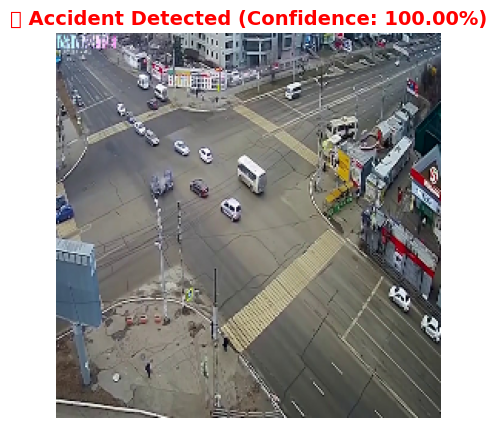

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 99.93% confidence! Immediate emergency alert triggered!


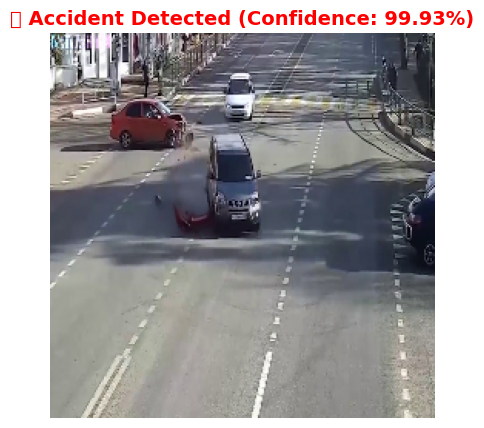

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


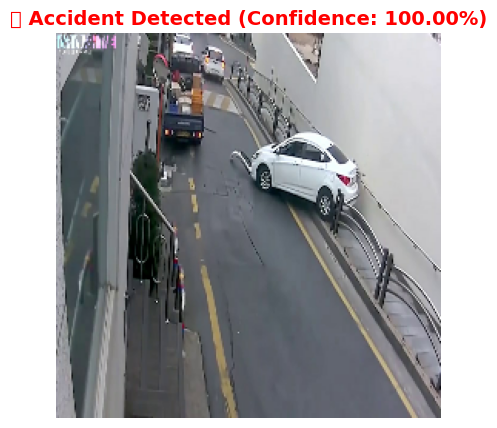

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...
✅ Sample 37: No accident detected.


🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


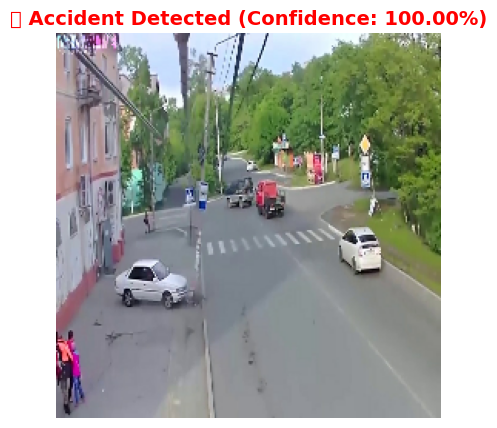

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...
✅ Sample 39: No accident detected.

✅ Sample 40: No accident detected.


🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


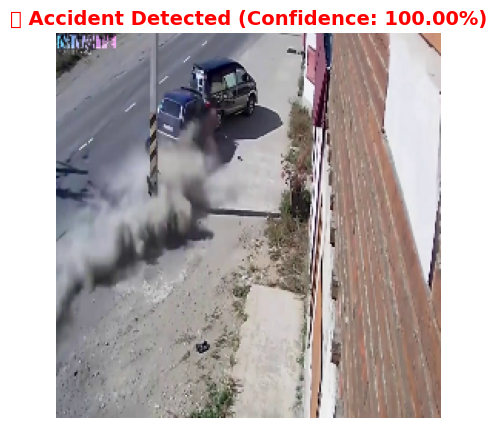

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


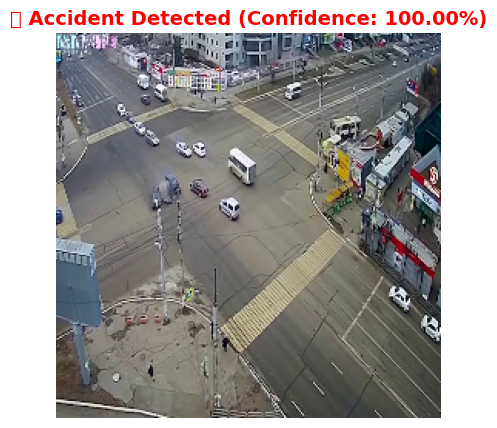

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...
✅ Sample 43: No accident detected.

✅ Sample 44: No accident detected.

✅ Sample 45: No accident detected.


🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


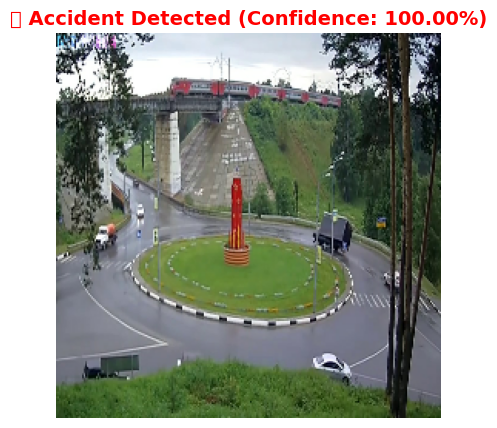

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

⚠️ Accident detected with 73.07% confidence. Alerting emergency services...


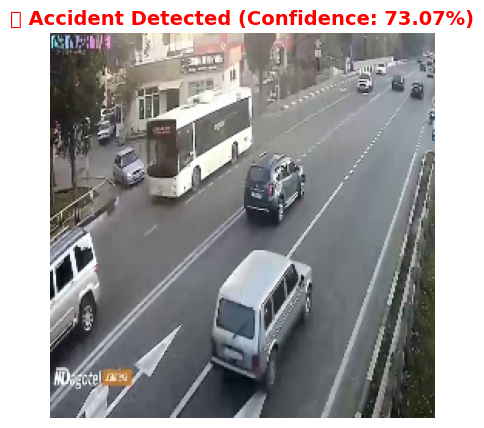

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 93.26% confidence! Immediate emergency alert triggered!


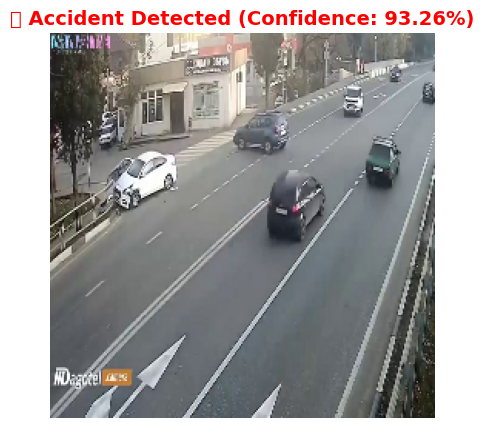

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...
✅ Sample 49: No accident detected.


⚠️ Accident detected with 87.32% confidence. Alerting emergency services...


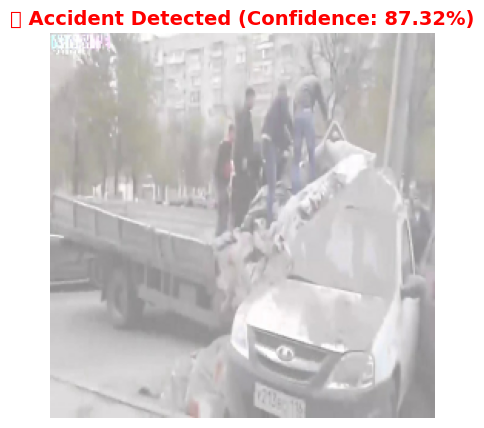

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


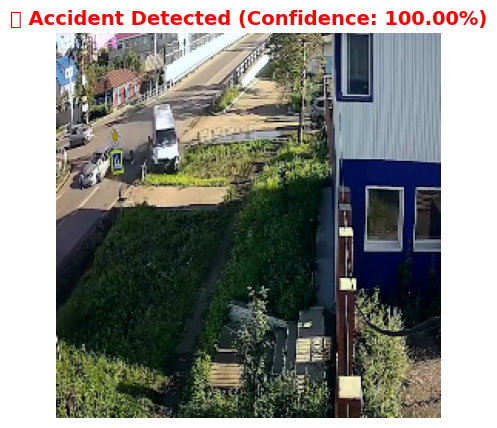

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...
✅ Sample 52: No accident detected.


🚨 CRITICAL Accident detected with 99.97% confidence! Immediate emergency alert triggered!


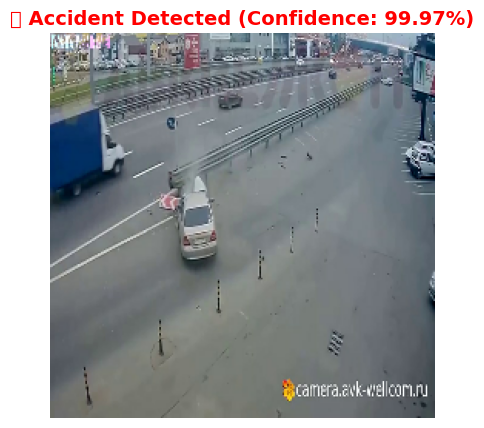

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

⚠️ Accident detected with 76.59% confidence. Alerting emergency services...


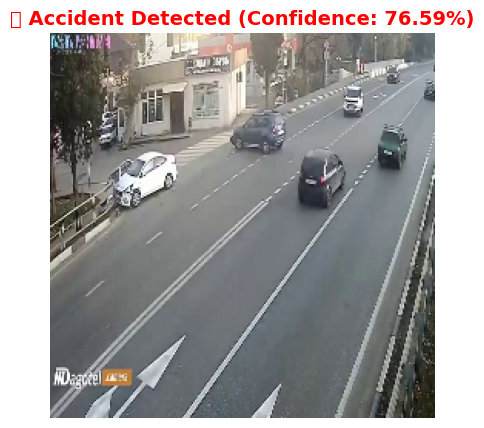

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 97.10% confidence! Immediate emergency alert triggered!


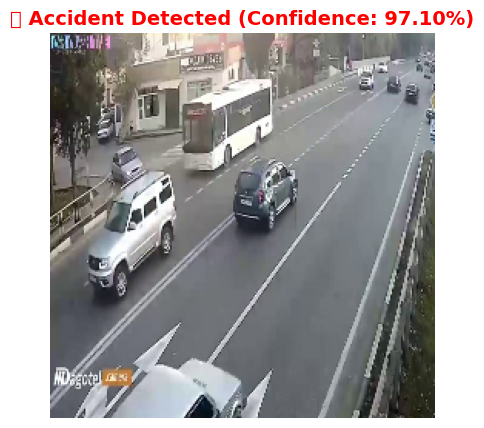

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...
✅ Sample 56: No accident detected.

✅ Sample 57: No accident detected.

✅ Sample 58: No accident detected.

✅ Sample 59: No accident detected.


🚨 CRITICAL Accident detected with 99.95% confidence! Immediate emergency alert triggered!


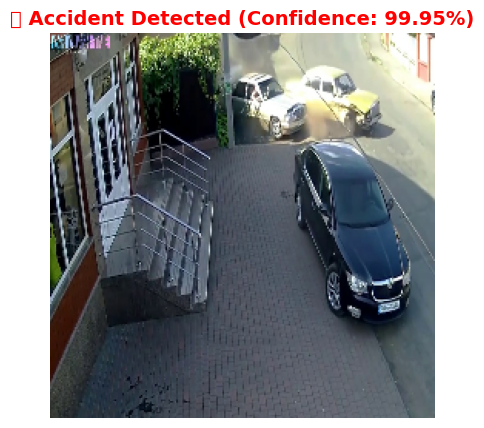

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...
✅ Sample 61: No accident detected.


🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


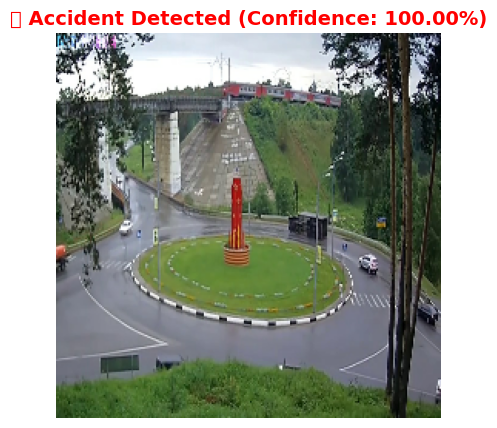

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


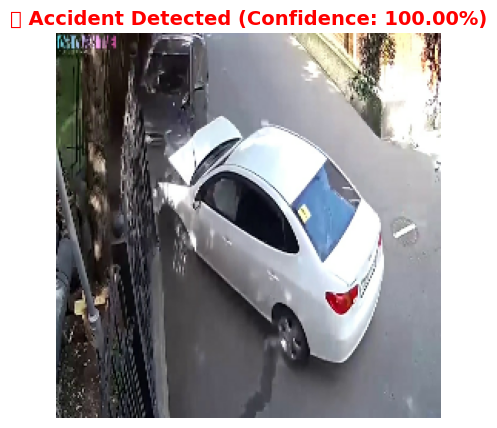

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 99.93% confidence! Immediate emergency alert triggered!


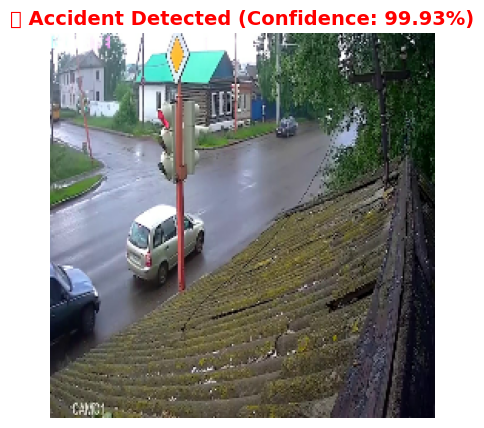

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...
✅ Sample 65: No accident detected.

✅ Sample 66: No accident detected.


🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


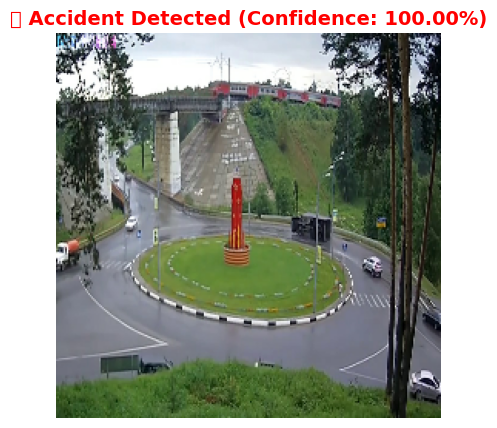

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...
✅ Sample 68: No accident detected.

✅ Sample 69: No accident detected.

✅ Sample 70: No accident detected.


🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


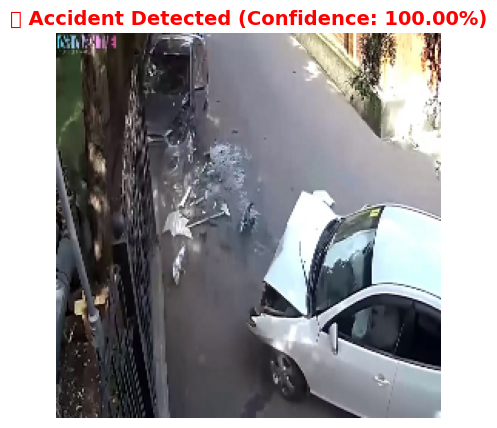

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


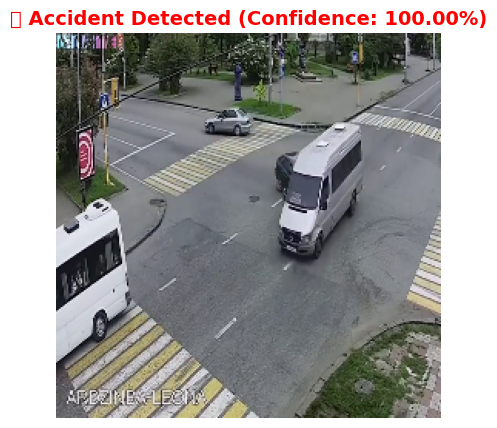

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...
✅ Sample 73: No accident detected.

✅ Sample 74: No accident detected.

✅ Sample 75: No accident detected.

✅ Sample 76: No accident detected.

✅ Sample 77: No accident detected.

✅ Sample 78: No accident detected.


🚨 CRITICAL Accident detected with 99.71% confidence! Immediate emergency alert triggered!


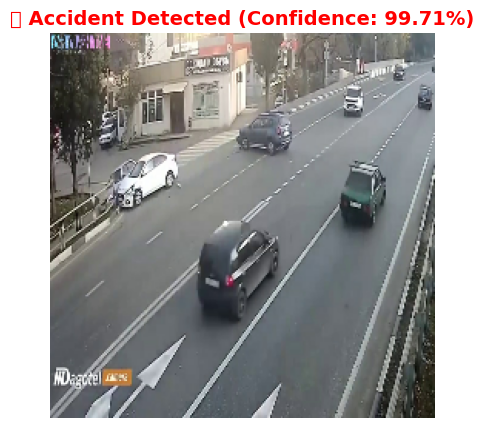

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


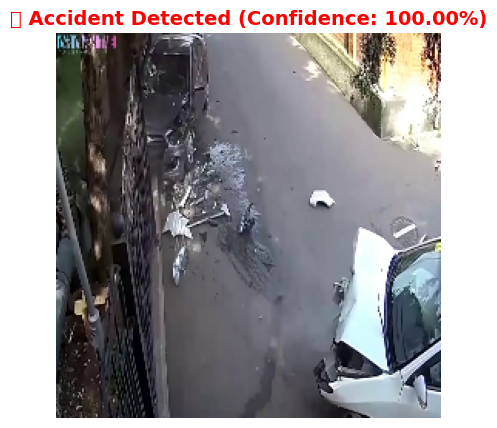

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...
✅ Sample 81: No accident detected.

✅ Sample 82: No accident detected.

✅ Sample 83: No accident detected.

✅ Sample 84: No accident detected.

✅ Sample 85: No accident detected.


🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


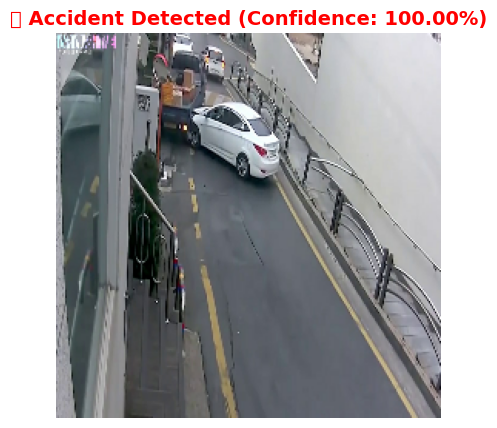

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


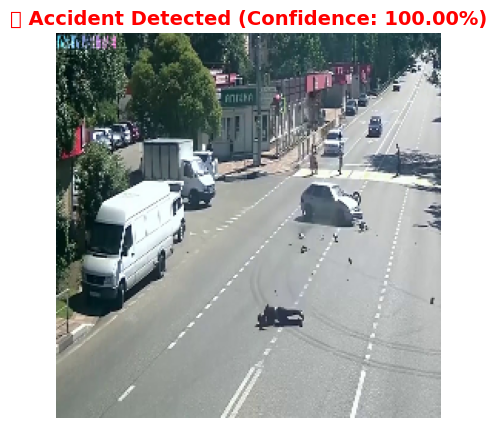

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


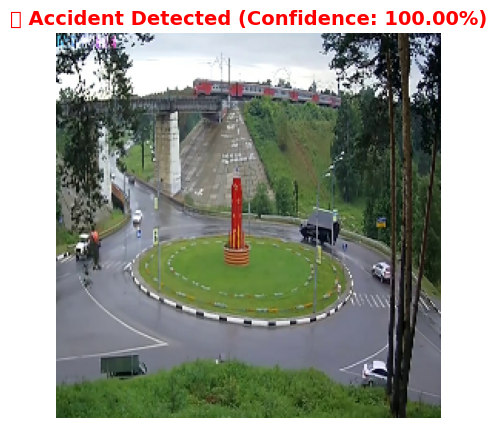

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 99.96% confidence! Immediate emergency alert triggered!


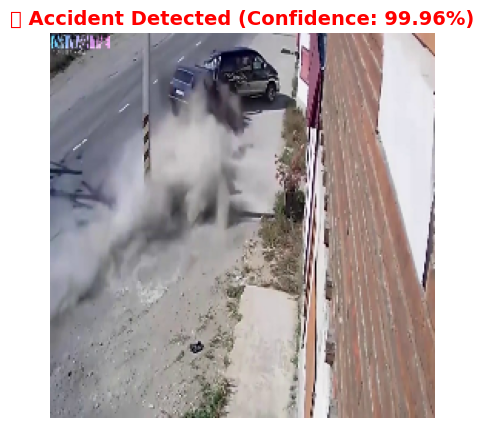

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...

🚨 CRITICAL Accident detected with 99.97% confidence! Immediate emergency alert triggered!


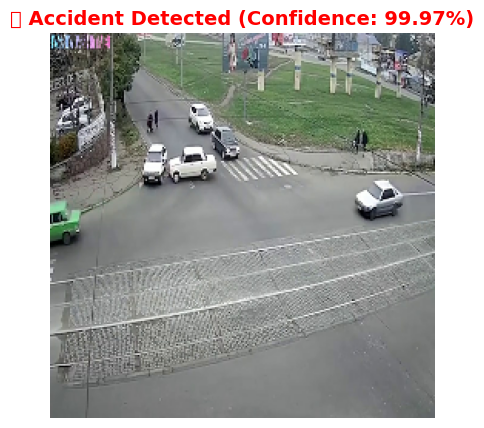

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...
✅ Sample 91: No accident detected.

✅ Sample 92: No accident detected.

✅ Sample 93: No accident detected.

✅ Sample 94: No accident detected.


🚨 CRITICAL Accident detected with 100.00% confidence! Immediate emergency alert triggered!


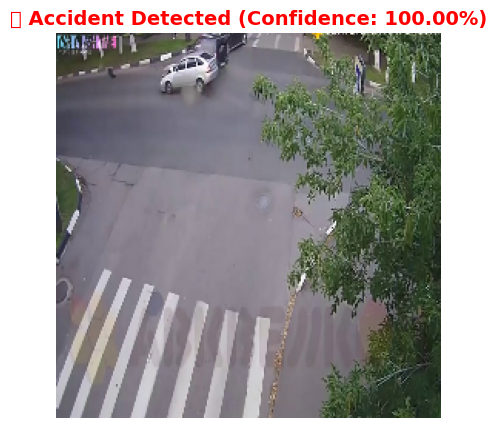

📧 Sending simulated SMS alert to 911 Dispatch Center...
📧 Sending simulated SMS alert to Nearby Hospital...
📧 Sending simulated SMS alert to Local Police Station...
✅ Sample 96: No accident detected.

✅ Sample 97: No accident detected.

✅ Sample 98: No accident detected.

✅ Sample 99: No accident detected.


🚀 BONUS Detection Complete!


In [ ]:
from IPython.display import display
import matplotlib.pyplot as plt

# Thresholds
threshold = 0.7  # Standard alert threshold
critical_threshold = 0.9  # Critical alert threshold

# Simulated Emergency Contact Details
emergency_contacts = ['911 Dispatch Center', 'Nearby Hospital', 'Local Police Station']

print("\n\U0001F680 BONUS: Enhanced Accident Detection System Running...\n")

for images, labels in testing_dataset.take(1):
    predictions = model.predict(images)

    for idx, pred in enumerate(predictions):
        pred_class = np.argmax(pred)
        confidence = np.max(pred)

        if pred_class == class_names.index('Accident') and confidence > threshold:
            if confidence > critical_threshold:
                print(f"\n\U0001F6A8 CRITICAL Accident detected with {confidence:.2%} confidence! Immediate emergency alert triggered!")
            else:
                print(f"\n⚠️ Accident detected with {confidence:.2%} confidence. Alerting emergency services...")

            # Display accident image
            plt.figure(figsize=(5, 5))
            plt.imshow(images[idx].numpy().astype("uint8"))
            plt.title(f"\U0001F6A8 Accident Detected (Confidence: {confidence:.2%})", fontsize=14, fontweight='bold', color='red')
            plt.axis('off')
            plt.show()

            # Simulate emergency SMS sending
            for contact in emergency_contacts:
                print(f"\U0001F4E7 Sending simulated SMS alert to {contact}...")

        else:
            print(f"✅ Sample {idx}: No accident detected.\n")

print("\n\U0001F680 BONUS Detection Complete!")

In [ ]:
from sklearn.metrics import classification_report

# Prepare true and predicted labels
y_true = []
y_pred = []

for images, labels in testing_dataset:
    predictions = model.predict(images)
    preds = np.argmax(predictions, axis=1)
    y_pred.extend(preds)
    y_true.extend(labels.numpy())

# Classification report
report = classification_report(y_true, y_pred, target_names=class_names)
print("📋 Classification Report:\n", report)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
📋 Classification Report:
               precision    recall  f1-score   support

    Accident       0.92      0.94      0.93        47
Non Accident       0.94      0.92      0.93        53

    accuracy                           0.93       100
   macro avg       0.93      0.93      0.93       100
weighted avg       0.93      0.93      0.93       100

